In [296]:
import math
import numpy as np
import matplotlib.pyplot as plt
import collections
import pydotplus 
import statistics 
import pandas as pd
import os
from datetime import date
from tqdm.notebook import tqdm
from IPython.display import Image  
import scikitplot as skplt
import wittgenstein as lw
from imblearn.over_sampling import SMOTE

from scipy.stats import pearsonr
from scipy.spatial.distance import pdist,  squareform
import scipy.stats as stats
from scipy.stats import randint as sp_randint

from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, plot_confusion_matrix, ConfusionMatrixDisplay # For Model evaluation
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, confusion_matrix
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split, cross_validate, RandomizedSearchCV, GridSearchCV, RepeatedStratifiedKFold
from sklearn import tree, metrics
from sklearn.datasets import make_blobs
from sklearn.preprocessing import MinMaxScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier

import seaborn as sns
import re

## Load the dataset

In [297]:
users = pd.read_csv('../new_users.csv', lineterminator='\n', index_col=0)

In [298]:
users.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10458 entries, 0 to 10457
Data columns (total 29 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   user_id            10458 non-null  int64  
 1   name               10457 non-null  object 
 2   lang               10458 non-null  object 
 3   bot                10458 non-null  int64  
 4   statuses_count     10458 non-null  int64  
 5   count              10458 non-null  int64  
 6   retweet_received   10458 non-null  int64  
 7   reply_received     10458 non-null  int64  
 8   favorite_received  10458 non-null  int64  
 9   hashtag_used       10458 non-null  int64  
 10  urls_used          10458 non-null  int64  
 11  mentions_used      10458 non-null  int64  
 12  favorite_avg       10458 non-null  float64
 13  retweet_avg        10458 non-null  float64
 14  reply_avg          10458 non-null  float64
 15  urls_avg           10458 non-null  float64
 16  mentions_avg       104

## Utility Functions

In [299]:
def discretize_data(dataset, variables): #mapping categorical into numerical
    for variable in variables:
        #get the unique variable's values
        var = sorted(dataset[variable].unique())
        
        #generate a mapping from the variable's values to the number representation  
        mapping = dict(zip(var, range(0, len(var) + 1)))

        #add a new colum with the number representation of the variable
        dataset[variable+'_num'] = dataset[variable].map(mapping).astype(int)
    return dataset

In [545]:
def report_score(title, test_label, test_pred):
    print("\t\t" + title)
    print(classification_report(test_label, 
                            test_pred, 
                            target_names=['genuine_user', 'bot']))

In [554]:
def plot_matrix(title, test_label, test_pred, test_pred_w, test_pred_o, weight):
    title = title + " | Confusion Matrix"

    fig, axs = plt.subplots(1, 2 + weight, figsize=(20, 5), sharey='row')
    plt.suptitle(title)

    cm = confusion_matrix(test_label, test_pred, labels=[1,0])
    disp = ConfusionMatrixDisplay(cm, display_labels=['bot', 'genuine_user'])
    disp.plot(ax=axs[0])

    if weight == 1:
        cm_w = confusion_matrix(test_label, test_pred_w, labels=[1,0])
        disp = ConfusionMatrixDisplay(cm_w, display_labels=['bot', 'genuine_user'])
        disp.plot(ax=axs[1])

    cm_o = confusion_matrix(test_label, test_pred_o, labels=[1,0])
    disp = ConfusionMatrixDisplay(cm_o, display_labels=['bot', 'genuine_user'])
    disp.plot(ax=axs[1 + weight])

In [302]:
def spot_errors(test_label, test_pred):
    spotted_errors = []
    for i in range(len(test_label)):
        if(test_label.array[i]!= test_pred[i]):
            spotted_errors.append('darkred')
        else:
            spotted_errors.append('darkgray')
    return spotted_errors

def plot_prediction_data(test_set, test_label, test_pred, classifier_name, x, y):
    fig, (test_true_plt, test_pred_plt, errors_plt) = plt.subplots(1,3, figsize=(18,6), sharey=True)
    title = classifier_name + ' | Real vs Predicted labels'
    plt.suptitle(title)
    test_true_plt.set_title('True Label')
    test_true_plt.set_xlabel(x)
    test_true_plt.set_ylabel(y)
    test_true_plt.scatter(test_set[x].values, test_set[y].values, c=test_label.values, s=25, cmap='viridis')
    test_pred_plt.set_title('Predicted Label')
    test_pred_plt.set_xlabel(x)
    test_pred_plt.scatter(test_set[x].values, test_set[y].values, c=test_pred, s=25, cmap='viridis')
    spotted_errors = spot_errors(test_label, test_pred)
    errors_plt.set_title('Misclassification')
    errors_plt.set_xlabel(x)
    errors_plt.scatter(test_set[x].values, test_set[y].values, c=spotted_errors, s=25, cmap='viridis')
    plt.show()

In [526]:
def plot_roc(title, test_label, test_pred, test_pred_w, test_pred_o, weight):
    
    fpr, tpr, thresh = metrics.roc_curve(test_label, test_pred)
    auc = metrics.roc_auc_score(test_label, test_pred)
    plt.plot(fpr,tpr,label="Original, auc="+str(auc))

    if (weight == 1):
        fpr, tpr, thresh = metrics.roc_curve(test_label, test_pred_w)
        auc = metrics.roc_auc_score(test_label, test_pred_w)
        plt.plot(fpr,tpr,label="Weight, auc="+str(auc))

    fpr, tpr, thresh = metrics.roc_curve(test_label, test_pred_o)
    auc = metrics.roc_auc_score(test_label, test_pred_o)
    plt.plot(fpr,tpr,label="Oversampling, auc="+str(auc))

    plt.plot([0,1], [0,1], color='black', linestyle='--')

    plt.xlabel("False Positive Rate", fontsize=13)
    plt.ylabel("True Positive Rate", fontsize=13)
    plt.title(title + " | ROC Curve Analysis")

    plt.legend(loc=0)

## Preliminaries

##### Filtering Dataset Attribute to classification

In [303]:
columns = ['lang']
data = discretize_data(users, columns)
data

,user_id,name,lang,bot,statuses_count,count,retweet_received,reply_received,favorite_received,hashtag_used,...,activity_period,Bot_Entropy,sub_year,sub_month,sub_day,retweet_max,reply_max,favorite_max,interaction_count,lang_num
0,2353593986,Lamonica Raborn,en,1,132,132,5,0,5,13,...,5,0.001426,2019,2,22,1.0,0.0,1.0,9,4
1,2358850842,Lourie Botton,en,0,122,122,3,0,6,4,...,5,NaN,2019,2,26,1.0,0.0,1.0,9,4
2,466124818,Carletto Focia,it,1,1439,1439,1190,0,259,107,...,30,0.001426,2017,1,18,364.0,0.0,11.0,238,11
3,2571493866,MBK Ebook,en,0,7085,3656,62,0,226,479,...,4,NaN,2019,6,18,3.0,0.0,2.0,246,4
4,2199062688,Qq,en,0,7406,2081,31810,0,1260,54,...,19,NaN,2018,11,19,390.0,0.0,12.0,1643,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10453,1901595415,Prity Baleja,en,0,418,418,1601,0,89,566,...,4,NaN,2018,9,26,303.0,0.0,5.0,143,4
10454,2911861962,Madrid Lae Maika .,en,0,1126,1120,19585,0,66,245,...,4,NaN,2019,11,29,391.0,0.0,3.0,249,4
10455,1378532629,Clau Sato,en,0,3024,2088,7391,0,449,268,...,31,NaN,2018,4,27,395.0,0.0,4.0,441,4
10456,2383025796,Minnie Guadagno,en,1,105,105,7,0,9,1,...,4,0.001426,2019,3,13,2.0,0.0,1.0,11,4


In [304]:
#drop the categorical variables since we don't need them anymore 
data.drop(columns=['user_id', 'lang', 'name', 'Bot_Entropy', 'sub_day', 'sub_month', 'sub_day', 'favorite_avg', 'reply_avg', 'retweet_avg', 'statuses_count'], axis=1,inplace=True)

##### Creation of train and test dataset

In [305]:
label = data.pop('bot')
train_set, test_set, train_label, test_label = train_test_split(data, label, stratify=label, test_size=0.30)

##### Define Weights parameters

In [454]:
weights = {0:1.0, 1:100.0}
balance = [{0:1,1:5}, {0:1,1:10}, {0:1,1:15}, {0:1, 1:20}, {0:1, 1:30}, {0:1,1:50}, {0:1,1:100}, 'balanced']

##### Oversampling dataset with SMOTE

In [307]:
oversample = SMOTE(sampling_strategy=1)
training, labels = oversample.fit_resample(train_set, train_label)

In [308]:
train_label.value_counts(True)

1    0.51612
0    0.48388
Name: bot, dtype: float64

In [309]:
labels.value_counts(True)

0    0.5
1    0.5
Name: bot, dtype: float64

##### Creation of normalize train and test set

In [310]:
norm_columns = ['count', 'retweet_received', 'reply_received', 'favorite_received', 'hashtag_used', 'urls_used',
       'mentions_used', 'urls_avg', 'mentions_avg', 'hashtags_avg',
       'avg_lenght', 'tweets_per_year', 'activity_period', 'sub_year',
       'retweet_max', 'reply_max', 'favorite_max', 'interaction_count',
       'lang_num']
norm_train_set = train_set[norm_columns]
norm_test_set  = test_set[norm_columns]
norm_training = training[norm_columns]

norm_train_set[norm_columns] = MinMaxScaler().fit_transform(train_set)
norm_test_set[norm_columns] = MinMaxScaler().fit_transform(test_set)

norm_training[norm_columns] = MinMaxScaler().fit_transform(training)

## Classification

### Decision Tree Classification

##### Unbalanced Classification

In [311]:
dt = tree.DecisionTreeClassifier(criterion='gini', splitter='best', 
                                  max_depth=5, 
                                  min_samples_split=3, min_samples_leaf=4)
dt = dt.fit(train_set, train_label)

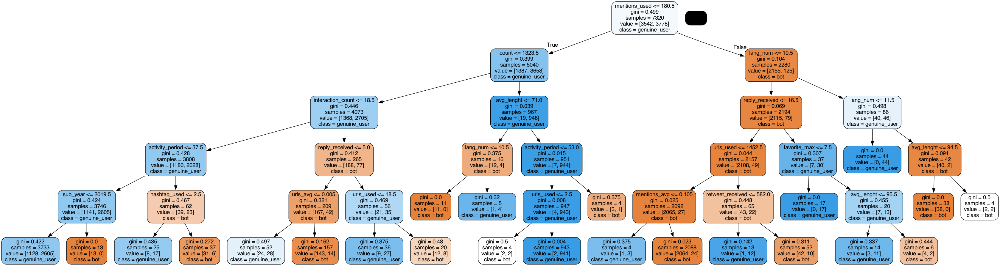

In [312]:
dot_data = tree.export_graphviz(dt, out_file=None, 
                         feature_names=list(train_set.columns),  
                         class_names=['bot', 'genuine_user'],  
                         filled=True, rounded=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

In [313]:
train_pred_dt = dt.predict(train_set)
test_pred_dt = dt.predict(test_set)

##### Weighted Classification

In [314]:
dt = tree.DecisionTreeClassifier(criterion='gini', splitter='best', 
                                  max_depth=5, class_weight=weights)
dt = dt.fit(train_set, train_label)

In [315]:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
param_grid = dict(class_weight=balance)
grid_search = GridSearchCV(estimator=dt, param_grid=param_grid, n_jobs=-1, cv=cv, scoring='roc_auc')

In [316]:
grid_result = grid_search.fit(train_set, train_label)

In [317]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# report all configurations
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.862322 using {'class_weight': 'balanced'}
0.860361 (0.008815) with: {'class_weight': {0: 5, 1: 1}}
0.858173 (0.008293) with: {'class_weight': {0: 10, 1: 1}}
0.857783 (0.008487) with: {'class_weight': {0: 15, 1: 1}}
0.861480 (0.010141) with: {'class_weight': {0: 2, 1: 1}}
0.855281 (0.010120) with: {'class_weight': {0: 30, 1: 1}}
0.848273 (0.008047) with: {'class_weight': {0: 50, 1: 1}}
0.845134 (0.008570) with: {'class_weight': {0: 100, 1: 1}}
0.862322 (0.009058) with: {'class_weight': 'balanced'}


In [318]:
dt = tree.DecisionTreeClassifier(criterion='gini', splitter='best', 
                                  max_depth=5, class_weight=grid_result.best_params_['class_weight'])
dt = dt.fit(train_set, train_label)

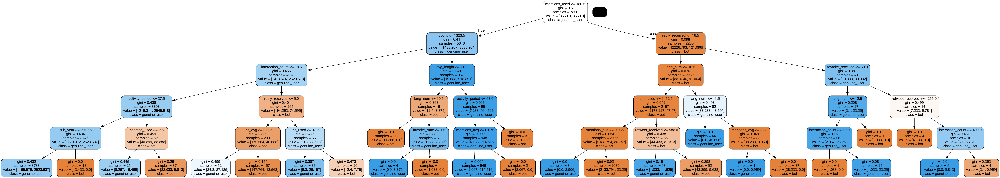

In [319]:
dot_data = tree.export_graphviz(dt, out_file=None, 
                         feature_names=list(train_set.columns),  
                         class_names=['bot', 'genuine_user'],  
                         filled=True, rounded=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

In [320]:
train_pred_dt_w = dt.predict(train_set)
test_pred_dt_w = dt.predict(test_set)

##### Classification with SMOTE oversampling

In [321]:
dt = tree.DecisionTreeClassifier(criterion='gini', splitter='best', 
                                  max_depth=5)
dt = dt.fit(training, labels)

In [322]:
train_pred_dt_o = dt.predict(train_set)
test_pred_dt_o = dt.predict(test_set)

##### Evaluation of Decision Tree Classification

In [556]:
print("\t\t\tTRAIN RESULT")
report_score("Decision Tree", train_label, train_pred_dt)
report_score("Decision Tree Weight", train_label, train_pred_dt_w)
report_score("Decision Tree Oversampling", train_label, train_pred_dt_o)

			TRAIN RESULT
		Decision Tree
              precision    recall  f1-score   support

genuine_user       0.97      0.67      0.79      3542
         bot       0.76      0.98      0.86      3778

    accuracy                           0.83      7320
   macro avg       0.87      0.82      0.82      7320
weighted avg       0.86      0.83      0.82      7320

		Decision Tree Weight
              precision    recall  f1-score   support

genuine_user       0.97      0.67      0.79      3542
         bot       0.76      0.98      0.86      3778

    accuracy                           0.83      7320
   macro avg       0.87      0.83      0.83      7320
weighted avg       0.86      0.83      0.83      7320

		Decision Tree Oversampling
              precision    recall  f1-score   support

genuine_user       0.96      0.68      0.79      3542
         bot       0.76      0.97      0.85      3778

    accuracy                           0.83      7320
   macro avg       0.86      0.82      0.82 

In [557]:
print("\t\t\tTEST SCORE")
report_score("Decision Tree", test_label, test_pred_dt)
report_score("Decision Tree Weight", test_label, test_pred_dt_w)
report_score("Decision Tree Oversampling", test_label, test_pred_dt_o)

			TEST SCORE
		Decision Tree
              precision    recall  f1-score   support

genuine_user       0.95      0.66      0.78      1518
         bot       0.75      0.97      0.85      1620

    accuracy                           0.82      3138
   macro avg       0.85      0.81      0.81      3138
weighted avg       0.85      0.82      0.82      3138

		Decision Tree Weight
              precision    recall  f1-score   support

genuine_user       0.95      0.66      0.78      1518
         bot       0.75      0.97      0.85      1620

    accuracy                           0.82      3138
   macro avg       0.85      0.82      0.82      3138
weighted avg       0.85      0.82      0.82      3138

		Decision Tree Oversampling
              precision    recall  f1-score   support

genuine_user       0.95      0.67      0.79      1518
         bot       0.76      0.96      0.85      1620

    accuracy                           0.82      3138
   macro avg       0.85      0.82      0.82   

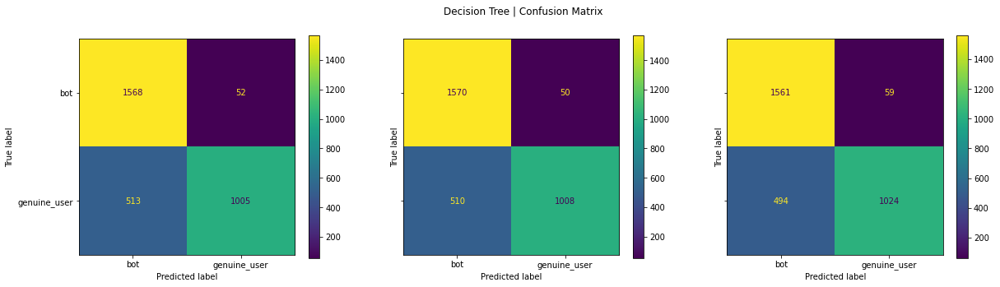

In [558]:
plot_matrix("Decision Tree", test_label, test_pred_dt, test_pred_dt_w, test_pred_dt_o, 1)

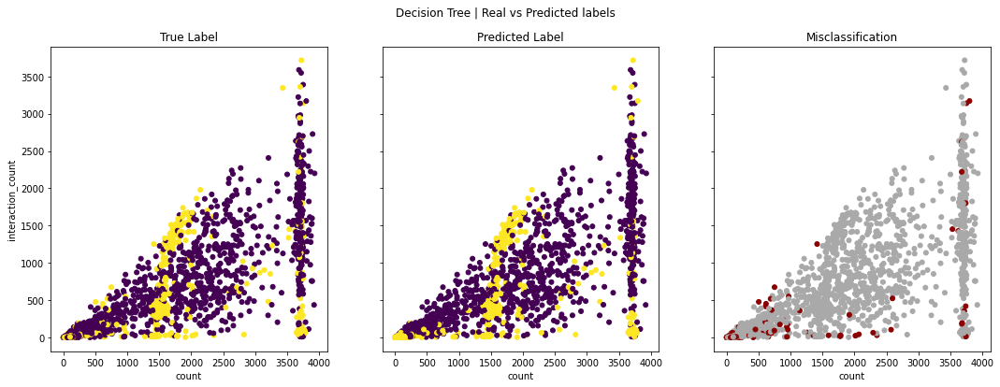

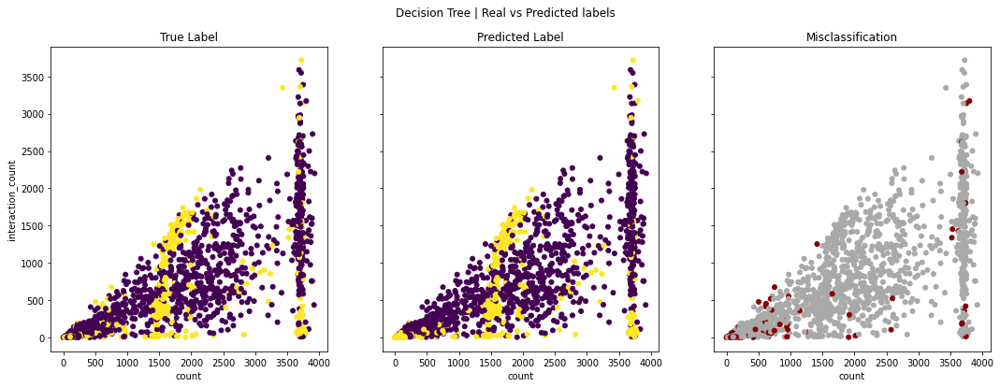

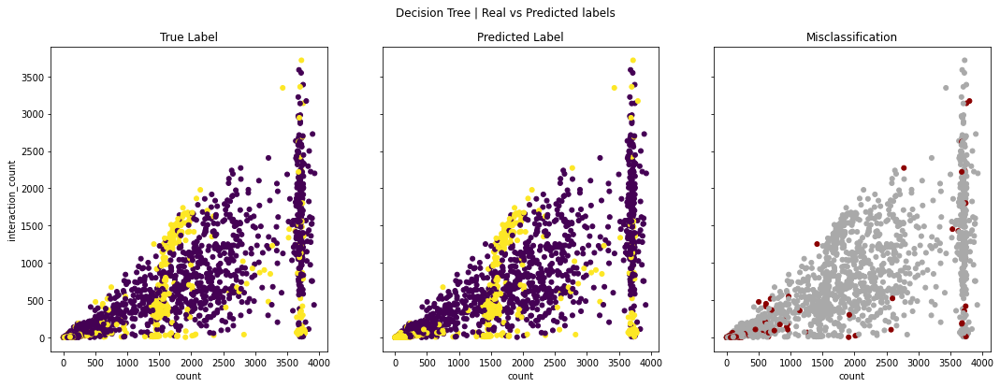

In [326]:
plot_prediction_data(test_set, test_label, test_pred_dt, 'Decision Tree', 'count', 'interaction_count')
plot_prediction_data(test_set, test_label, test_pred_dt_w, 'Decision Tree', 'count', 'interaction_count')
plot_prediction_data(test_set, test_label, test_pred_dt_o, 'Decision Tree', 'count', 'interaction_count')

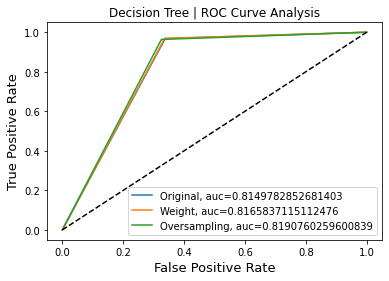

In [527]:
plot_roc("Decision Tree", test_label, test_pred_dt, test_pred_dt_w, test_pred_dt_o, 1)

### Gaussian Naive Bayes Classification

##### Unbalanced Classification

In [327]:
gnb = GaussianNB()
gnb.fit(train_set, train_label)

GaussianNB()

In [328]:
train_pred_gnb = gnb.predict(train_set)
test_pred_gnb = gnb.predict(test_set)

##### Oversampling Classification with SMOTE

In [329]:
gnb_model = GaussianNB()
gnb_model.fit(training, labels)

GaussianNB()

In [330]:
train_pred_gnb_o = gnb_model.predict(train_set)
test_pred_gnb_o = gnb_model.predict(test_set)

##### Gaussian Naive Bayes evaluation

In [559]:
print("\t\t\tTEST RESULT")
report_score("GNB", train_label, train_pred_gnb)
report_score("GNB Oversampling", train_label, train_pred_gnb_o)

			TEST RESULT
		GNB
              precision    recall  f1-score   support

genuine_user       0.93      0.59      0.72      3542
         bot       0.71      0.96      0.82      3778

    accuracy                           0.78      7320
   macro avg       0.82      0.78      0.77      7320
weighted avg       0.82      0.78      0.77      7320

		GNB Oversampling
              precision    recall  f1-score   support

genuine_user       0.93      0.60      0.73      3542
         bot       0.72      0.96      0.82      3778

    accuracy                           0.78      7320
   macro avg       0.82      0.78      0.77      7320
weighted avg       0.82      0.78      0.77      7320



In [561]:
print("\t\t\tTEST RESULT")
report_score("GNB", test_label, test_pred_gnb)
report_score("GNB Oversampling", test_label, test_pred_gnb_o)

			TEST RESULT
		GNB
              precision    recall  f1-score   support

genuine_user       0.94      0.60      0.73      1518
         bot       0.72      0.96      0.82      1620

    accuracy                           0.79      3138
   macro avg       0.83      0.78      0.78      3138
weighted avg       0.83      0.79      0.78      3138

		GNB Oversampling
              precision    recall  f1-score   support

genuine_user       0.94      0.60      0.73      1518
         bot       0.72      0.96      0.82      1620

    accuracy                           0.79      3138
   macro avg       0.83      0.78      0.78      3138
weighted avg       0.83      0.79      0.78      3138



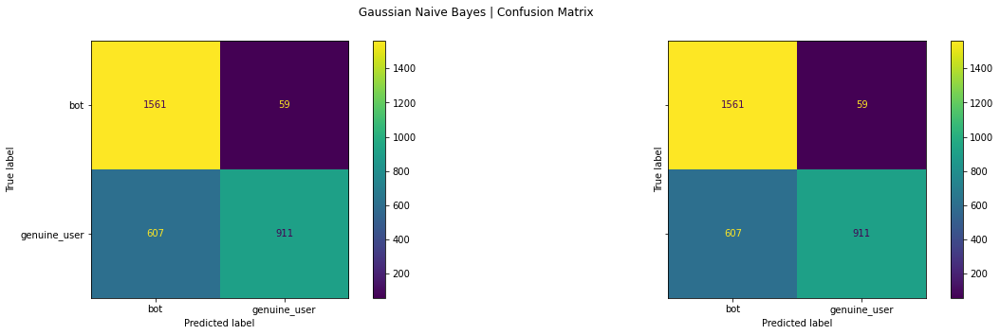

In [564]:
plot_matrix("Gaussian Naive Bayes", test_label, test_pred_gnb, None, test_pred_gnb_o, 0)

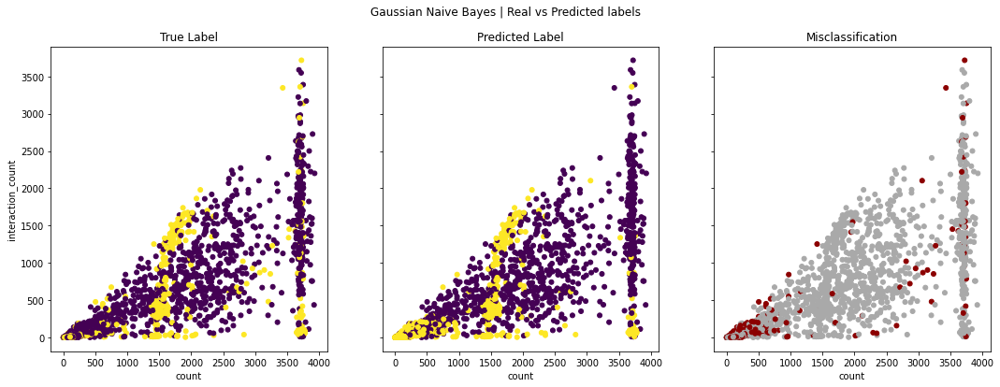

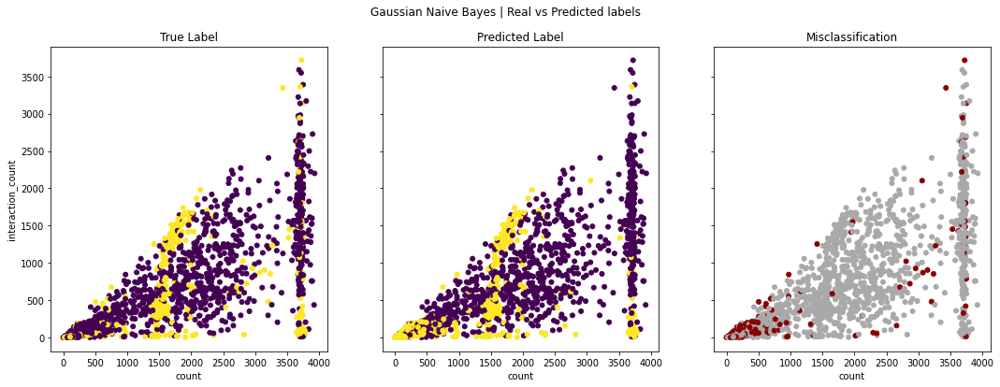

In [584]:
plot_prediction_data(test_set, test_label, test_pred_gnb, 'Gaussian Naive Bayes', 'count', 'interaction_count')
plot_prediction_data(test_set, test_label, test_pred_gnb_o, 'Gaussian Naive Bayes', 'count', 'interaction_count')

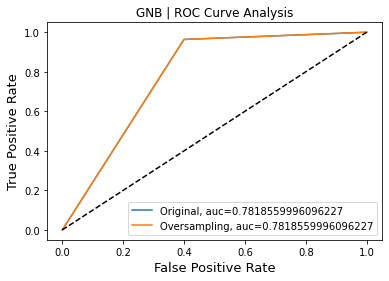

In [528]:
plot_roc("GNB", test_label, test_pred_gnb, None, test_pred_gnb_o, 0)

### Random Forest Classification

##### Unbalanced Classification

Searching for best parameters setting

In [335]:
#define the parameters' values you want to try
param_dist = {"max_depth": [2,3,5,6,7,10,12,None],
              "max_features": sp_randint(1, len(train_set.iloc[0]) + 1),
              "min_samples_split": sp_randint(10, 51),
              "min_samples_leaf": sp_randint(10, 51),
              "bootstrap": [True, False],
              "criterion": ["entropy", "gini"],
              "class_weight":['balanced', None, {0: 0.3, 1: 0.7}]}
#define the number of iters
n_iter_search = 50
#define the model
clf = RandomForestClassifier(n_estimators=30)
#define the grid search
grid_search = RandomizedSearchCV(clf, param_distributions=param_dist, 
                            n_iter=n_iter_search, 
                            n_jobs=10, 
                            scoring=make_scorer(accuracy_score))
#run the grid search
grid_search.fit(train_set, train_label)

RandomizedSearchCV(estimator=RandomForestClassifier(n_estimators=30), n_iter=50,
                   n_jobs=10,
                   param_distributions={'bootstrap': [True, False],
                                        'class_weight': ['balanced', None,
                                                         {0: 0.3, 1: 0.7}],
                                        'criterion': ['entropy', 'gini'],
                                        'max_depth': [2, 3, 5, 6, 7, 10, 12,
                                                      None],
                                        'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x142152f20>,
                                        'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x130de7a60>,
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x1242d0190>},
                   scoring=make_scorer(accuracy_score))

In [336]:
print('Best setting parameters ', grid_search.cv_results_['params'][0])
print('Mean and std of this setting ', grid_search.cv_results_['mean_test_score'][0], 
      grid_search.cv_results_['std_test_score'][0])

Best setting parameters  {'bootstrap': False, 'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 12, 'max_features': 13, 'min_samples_leaf': 21, 'min_samples_split': 24}
Mean and std of this setting  0.8196721311475411 0.013702124500677395


Now we can apply the model with the best parameters setting

In [337]:
rf = RandomForestClassifier(n_estimators=30, 
                             criterion='gini',
                             max_features=14,
                             max_depth=2, 
                             min_samples_split=18,
                             min_samples_leaf=43,
                             bootstrap=False) 
rf = rf.fit(train_set, train_label)

In [338]:
#prediction on the test test
train_pred_rf = rf.predict(train_set)

In [339]:
#prediction on the test test
test_pred_rf = rf.predict(test_set)

##### Weighted Classification

Searching for best parameters...

In [340]:
clf=RandomForestClassifier(n_estimators=100, class_weight=None)
# Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(train_set,train_label)

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
param_grid = dict(class_weight=balance)
grid_search = GridSearchCV(estimator=clf, param_grid=param_grid, n_jobs=-1, cv=cv, scoring='roc_auc')

grid_result = grid_search.fit(train_set, train_label)

print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# report all configurations
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))


Best: 0.874721 using {'class_weight': 'balanced'}
0.872090 (0.012326) with: {'class_weight': {0: 5, 1: 1}}
0.872261 (0.011654) with: {'class_weight': {0: 10, 1: 1}}
0.871498 (0.011967) with: {'class_weight': {0: 15, 1: 1}}
0.873422 (0.013132) with: {'class_weight': {0: 2, 1: 1}}
0.872202 (0.011371) with: {'class_weight': {0: 30, 1: 1}}
0.872093 (0.010636) with: {'class_weight': {0: 50, 1: 1}}
0.871032 (0.012496) with: {'class_weight': {0: 100, 1: 1}}
0.874721 (0.012606) with: {'class_weight': 'balanced'}


Let's apply the classifier with the best parameters found:

In [341]:
clf=RandomForestClassifier(n_estimators=100, class_weight=grid_result.best_params_['class_weight'])
clf.fit(train_set,train_label)


RandomForestClassifier(class_weight='balanced')

In [342]:
y_pred=clf.predict(test_set)

train_pred_rf_w = clf.predict(train_set)

test_pred_rf_w = clf.predict(test_set)

##### Classification with SMOTE oversampling

In [343]:
clf=RandomForestClassifier(n_estimators=100)

clf.fit(training, labels)

RandomForestClassifier()

In [344]:
train_pred_rf_o = clf.predict(train_set)
test_pred_rf_o = clf.predict(test_set)

##### Random Forest Classification evaluation

In [566]:
print("\t\t\tTRAIN RESULT")
report_score("Random Forest", train_label, train_pred_rf)
report_score("Random Forest Weight", train_label, train_pred_rf_w)
report_score("Random Forest Oversampling", train_label, train_pred_rf_o)

			TRAIN RESULT
		Random Forest
              precision    recall  f1-score   support

genuine_user       0.95      0.61      0.74      3542
         bot       0.73      0.97      0.83      3778

    accuracy                           0.79      7320
   macro avg       0.84      0.79      0.79      7320
weighted avg       0.83      0.79      0.79      7320

		Random Forest Weight
              precision    recall  f1-score   support

genuine_user       1.00      1.00      1.00      3542
         bot       1.00      1.00      1.00      3778

    accuracy                           1.00      7320
   macro avg       1.00      1.00      1.00      7320
weighted avg       1.00      1.00      1.00      7320

		Random Forest Oversampling
              precision    recall  f1-score   support

genuine_user       1.00      1.00      1.00      3542
         bot       1.00      1.00      1.00      3778

    accuracy                           1.00      7320
   macro avg       1.00      1.00      1.00 

In [567]:
print("\t\t\tTEST RESULT")
report_score("Random Forest", test_label, test_pred_rf)
report_score("Random Forest Weight", test_label, test_pred_rf_w)
report_score("Random Forest Oversampling", test_label, test_pred_rf_o)

			TEST RESULT
		Random Forest
              precision    recall  f1-score   support

genuine_user       0.94      0.61      0.74      1518
         bot       0.73      0.97      0.83      1620

    accuracy                           0.79      3138
   macro avg       0.83      0.79      0.79      3138
weighted avg       0.83      0.79      0.79      3138

		Random Forest Weight
              precision    recall  f1-score   support

genuine_user       0.90      0.70      0.79      1518
         bot       0.77      0.92      0.84      1620

    accuracy                           0.82      3138
   macro avg       0.83      0.81      0.81      3138
weighted avg       0.83      0.82      0.81      3138

		Random Forest Oversampling
              precision    recall  f1-score   support

genuine_user       0.90      0.70      0.79      1518
         bot       0.77      0.93      0.84      1620

    accuracy                           0.82      3138
   macro avg       0.84      0.82      0.82  

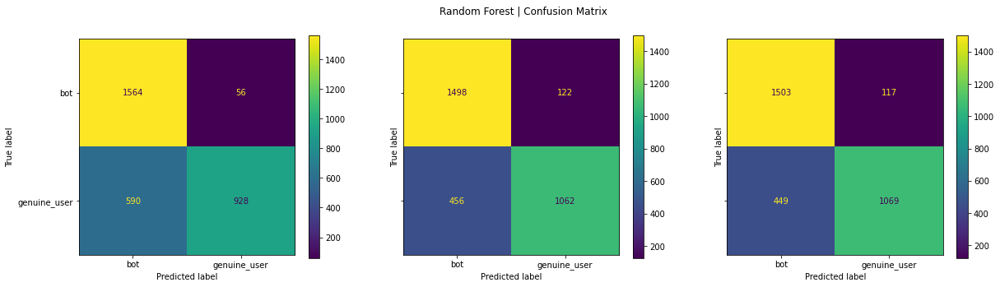

In [565]:
plot_matrix("Random Forest", test_label, test_pred_rf, test_pred_rf_w, test_pred_rf_o, 1)

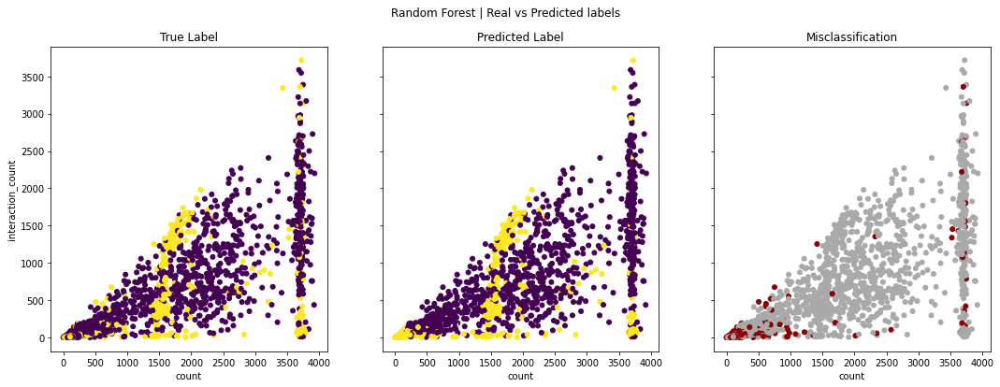

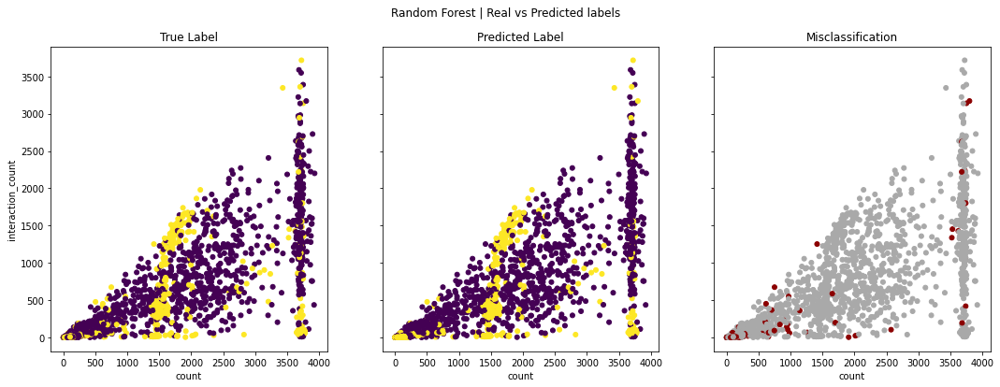

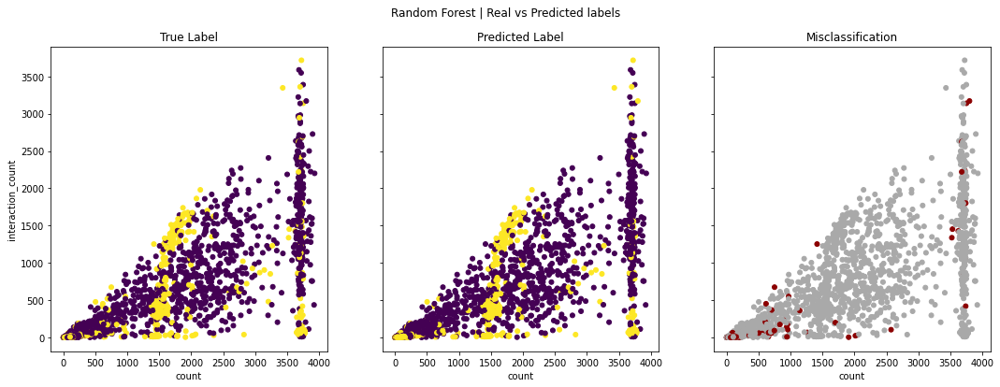

In [585]:
plot_prediction_data(test_set, test_label, test_pred_rf, 'Random Forest', 'count', 'interaction_count')
plot_prediction_data(test_set, test_label, test_pred_rf_w, 'Random Forest', 'count', 'interaction_count')
plot_prediction_data(test_set, test_label, test_pred_rf_o, 'Random Forest', 'count', 'interaction_count')

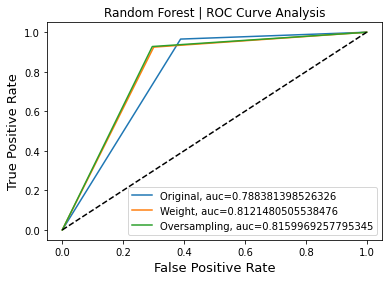

In [529]:
plot_roc("Random Forest", test_label, test_pred_rf, test_pred_rf_w, test_pred_rf_o, 1)

### AdaBoost Classfication

In [349]:
base = tree.DecisionTreeClassifier(max_depth=3)
clf = AdaBoostClassifier(base_estimator=base, n_estimators=50)
clf.fit(train_set, train_label)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3))

In [350]:
train_pred_clf = clf.predict(train_set)
test_pred_clf = clf.predict(test_set)

##### Classification with SMOTE oversampling

In [351]:
base = tree.DecisionTreeClassifier(max_depth=3)
clf = AdaBoostClassifier(base_estimator=base, n_estimators=50)

model = clf.fit(training, labels)

In [352]:
train_pred_clf_o = model.predict(train_set)
test_pred_clf_o = model.predict(test_set)

##### Evaluation of AdaBoost Classification

In [568]:
print("\t\t\tTRAIN RESULT")
report_score("AdaBoost", train_label, train_pred_clf)
report_score("AdaBoost Oversampling", train_label, train_pred_clf_o)

			TRAIN RESULT
		AdaBoost
              precision    recall  f1-score   support

genuine_user       0.97      0.75      0.85      3542
         bot       0.81      0.98      0.88      3778

    accuracy                           0.87      7320
   macro avg       0.89      0.86      0.87      7320
weighted avg       0.89      0.87      0.87      7320

		AdaBoost Oversampling
              precision    recall  f1-score   support

genuine_user       0.96      0.76      0.85      3542
         bot       0.81      0.97      0.88      3778

    accuracy                           0.87      7320
   macro avg       0.89      0.86      0.87      7320
weighted avg       0.88      0.87      0.87      7320



In [569]:
print("\t\t\tTEST RESULT")
report_score("AdaBoost", test_label, test_pred_clf)
report_score("AdaBoost Oversampling", test_label, test_pred_clf_o)

			TEST RESULT
		AdaBoost
              precision    recall  f1-score   support

genuine_user       0.90      0.71      0.79      1518
         bot       0.77      0.92      0.84      1620

    accuracy                           0.82      3138
   macro avg       0.83      0.81      0.82      3138
weighted avg       0.83      0.82      0.82      3138

		AdaBoost Oversampling
              precision    recall  f1-score   support

genuine_user       0.88      0.70      0.78      1518
         bot       0.76      0.91      0.83      1620

    accuracy                           0.81      3138
   macro avg       0.82      0.81      0.81      3138
weighted avg       0.82      0.81      0.81      3138



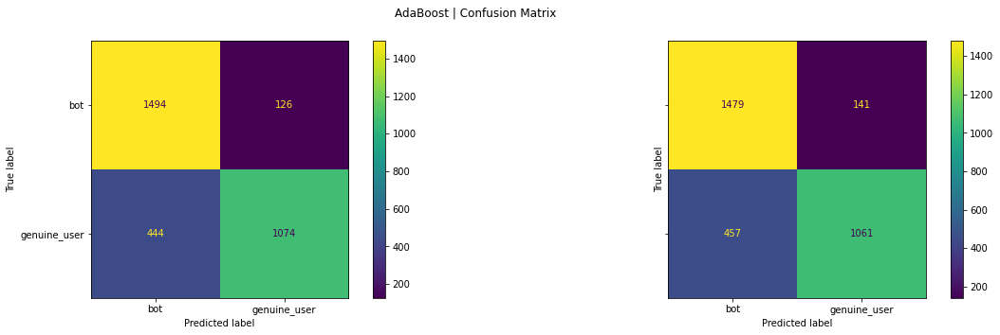

In [570]:
plot_matrix("AdaBoost", test_label, test_pred_clf, None, test_pred_clf_o, 0)

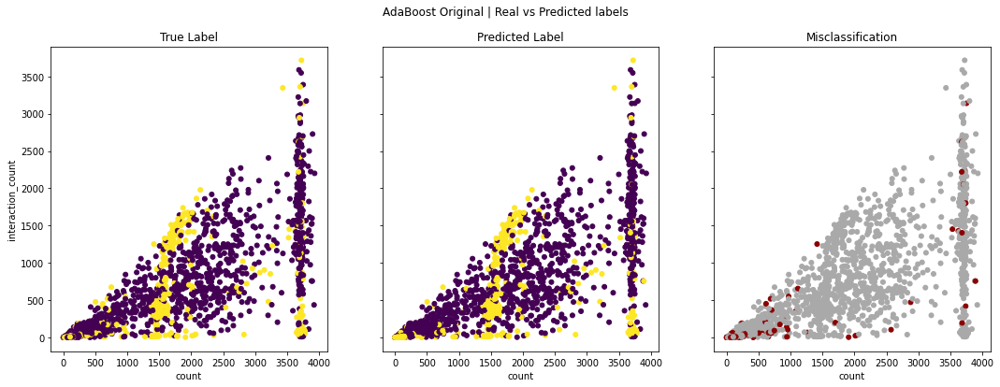

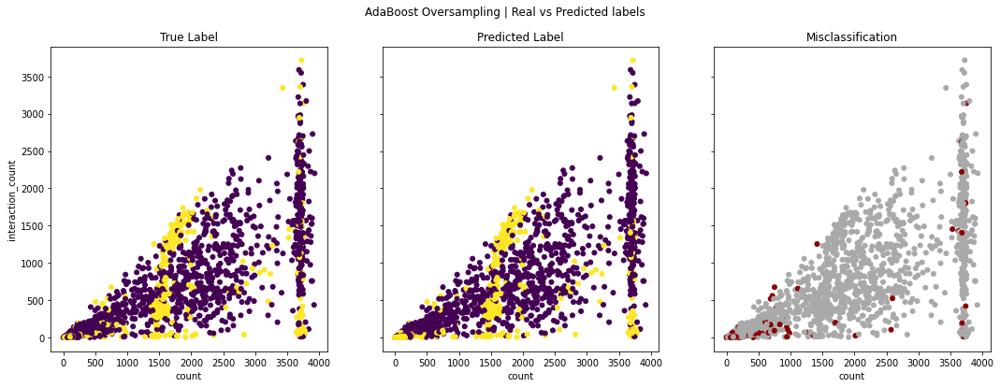

In [586]:
plot_prediction_data(test_set, test_label, test_pred_clf, 'AdaBoost Original', 'count', 'interaction_count')
plot_prediction_data(test_set, test_label, test_pred_clf_o, 'AdaBoost Oversampling', 'count', 'interaction_count')

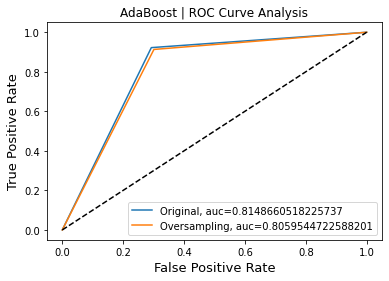

In [533]:
plot_roc("AdaBoost", test_label, test_pred_clf, None, test_pred_clf_o, 0)

### SVM Classification

##### Unbalanced Classification

In [357]:
svm = SVC(kernel='sigmoid', C=0.5, gamma='scale', probability=True)
svm.fit(train_set, train_label)

SVC(C=0.5, kernel='sigmoid', probability=True)

In [358]:
train_pred_svm = svm.predict(train_set)

In [359]:
test_pred_svm = svm.predict(test_set)

##### Weighted Classification

In [455]:
svm = SVC(gamma='scale', class_weight=weights)
svm.fit(train_set, train_label)


SVC(class_weight={0: 1.0, 1: 100.0})

In [456]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
param_grid = dict(class_weight=balance)
grid_search = GridSearchCV(estimator=svm, param_grid=param_grid, n_jobs=-1, cv=cv, scoring='roc_auc')
grid_result = grid_search.fit(train_set, train_label)
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best: 0.845396 using {'class_weight': {0: 1, 1: 5}}


In [457]:
# report all configurations
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))


0.845396 (0.018058) with: {'class_weight': {0: 1, 1: 5}}
0.844304 (0.015686) with: {'class_weight': {0: 1, 1: 10}}
0.837624 (0.014404) with: {'class_weight': {0: 1, 1: 15}}
0.834012 (0.014884) with: {'class_weight': {0: 1, 1: 20}}
0.823287 (0.015816) with: {'class_weight': {0: 1, 1: 30}}
0.807750 (0.017695) with: {'class_weight': {0: 1, 1: 50}}
0.789379 (0.018012) with: {'class_weight': {0: 1, 1: 100}}
0.827380 (0.016039) with: {'class_weight': 'balanced'}


In [458]:
svm = SVC(gamma='scale', class_weight=grid_result.best_params_['class_weight'])
svm.fit(train_set, train_label)


SVC(class_weight={0: 1, 1: 5})

In [459]:
train_pred_svm_w = svm.predict(train_set)
test_pred_svm_w = svm.predict(test_set)

##### Classification with SMOTE oversampling

In [453]:
svm = SVC(kernel='sigmoid', gamma='scale')
svm.fit(training, labels)

SVC(kernel='sigmoid')

In [366]:
train_pred_svm_o = svm.predict(train_set)
test_pred_svm_o = svm.predict(test_set)

##### Evaluation

In [571]:
print("\t\t\tTRAIN RESULT")
report_score("SVM", train_label, train_pred_svm)
report_score("SVM Weight", train_label, train_pred_svm_w)
report_score("SVM Oversampling", train_label, train_pred_svm_o)

			TRAIN RESULT
		SVM
              precision    recall  f1-score   support

genuine_user       0.93      0.50      0.65      3542
         bot       0.67      0.96      0.79      3778

    accuracy                           0.74      7320
   macro avg       0.80      0.73      0.72      7320
weighted avg       0.80      0.74      0.72      7320

		SVM Weight
              precision    recall  f1-score   support

genuine_user       0.97      0.53      0.69      3542
         bot       0.69      0.99      0.81      3778

    accuracy                           0.77      7320
   macro avg       0.83      0.76      0.75      7320
weighted avg       0.83      0.77      0.75      7320

		SVM Oversampling
              precision    recall  f1-score   support

genuine_user       0.93      0.50      0.65      3542
         bot       0.67      0.96      0.79      3778

    accuracy                           0.74      7320
   macro avg       0.80      0.73      0.72      7320
weighted avg       0

In [572]:
print("\t\t\tTEST SCORE")
report_score("SVM", test_label, test_pred_svm)
report_score("SVM Weight", test_label, test_pred_svm_w)
report_score("SVM Oversampling", test_label, test_pred_svm_o)

			TEST SCORE
		SVM
              precision    recall  f1-score   support

genuine_user       0.93      0.49      0.64      1518
         bot       0.67      0.96      0.79      1620

    accuracy                           0.73      3138
   macro avg       0.80      0.73      0.72      3138
weighted avg       0.79      0.73      0.72      3138

		SVM Weight
              precision    recall  f1-score   support

genuine_user       0.96      0.52      0.67      1518
         bot       0.68      0.98      0.80      1620

    accuracy                           0.75      3138
   macro avg       0.82      0.75      0.74      3138
weighted avg       0.82      0.75      0.74      3138

		SVM Oversampling
              precision    recall  f1-score   support

genuine_user       0.93      0.49      0.65      1518
         bot       0.67      0.97      0.79      1620

    accuracy                           0.74      3138
   macro avg       0.80      0.73      0.72      3138
weighted avg       0.8

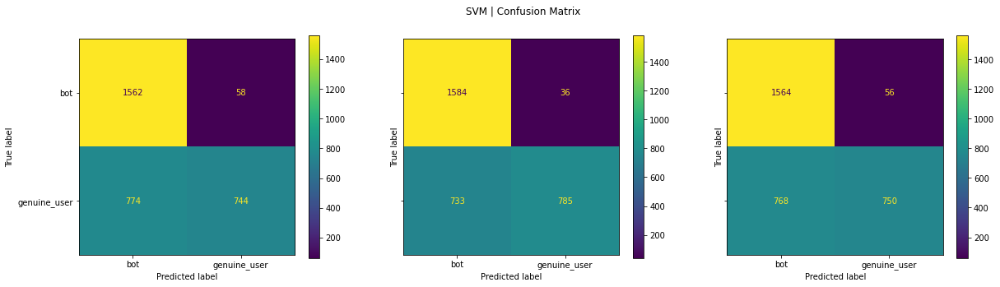

In [573]:
plot_matrix("SVM", test_label, test_pred_svm, test_pred_svm_w, test_pred_svm_o, 1)

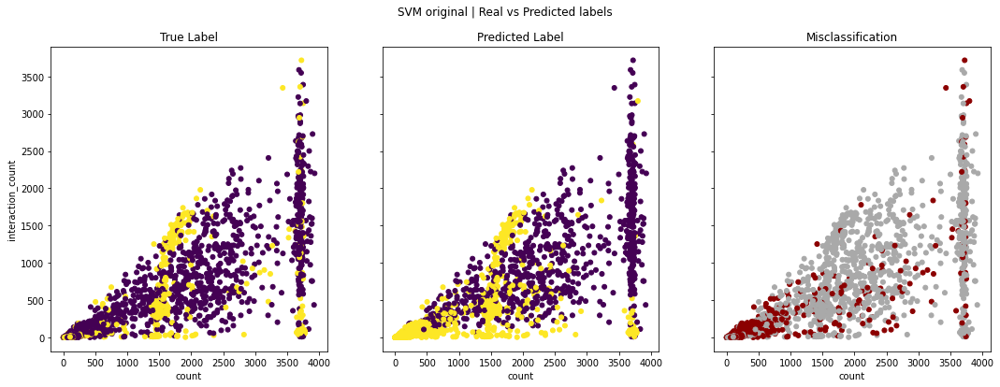

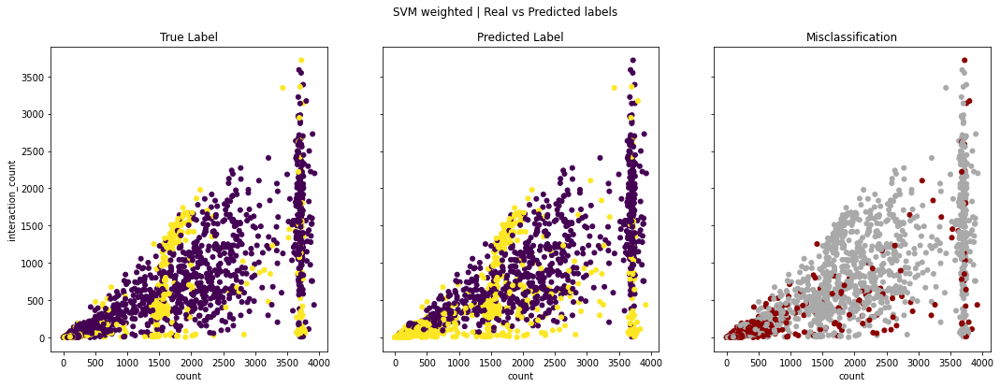

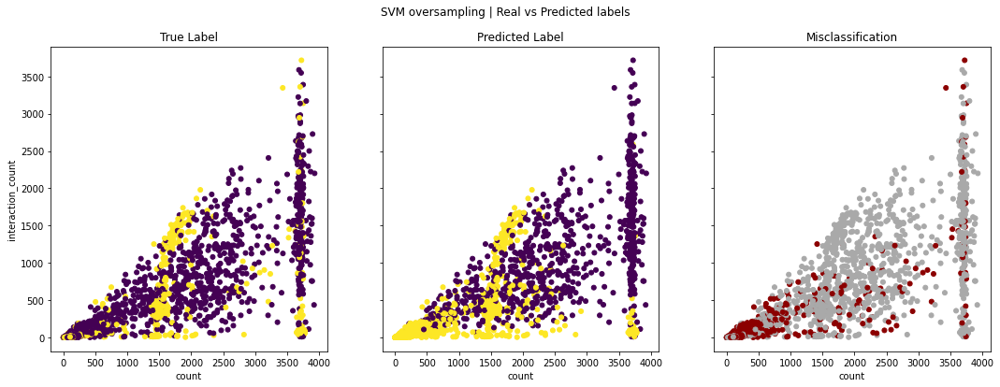

In [587]:
plot_prediction_data(test_set, test_label, test_pred_svm, 'SVM original', 'count', 'interaction_count')
plot_prediction_data(test_set, test_label, test_pred_svm_w, 'SVM weighted', 'count', 'interaction_count')
plot_prediction_data(test_set, test_label, test_pred_svm_o, 'SVM oversampling', 'count', 'interaction_count')

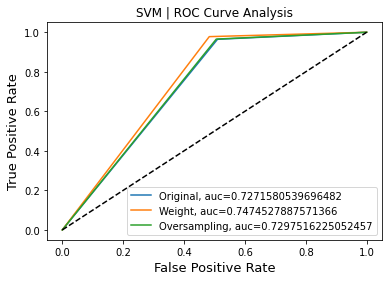

In [534]:
plot_roc("SVM", test_label, test_pred_svm, test_pred_svm_w, test_pred_svm_o, 1)

### Rule Based Classification

In [372]:
#we searching for best configuration parameters
ripper = lw.RIPPER()
param_grid = {"prune_size": [0.5, 0.6], "k": [1, 3, 5]}
grid_search = GridSearchCV(estimator=ripper, param_grid=param_grid)
grid_search.fit(train_set, train_label)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is dep

GridSearchCV(estimator=<RIPPER(max_rules=None, k=2, dl_allowance=64, random_state=None, prune_size=0.33, verbosity=0, max_rule_conds=None, max_total_conds=None, n_discretize_bins=10)>,
             param_grid={'k': [1, 3, 5], 'prune_size': [0.5, 0.6]})

In [373]:
grid_search.cv_results_['params'][0]

{'k': 1, 'prune_size': 0.5}

In [374]:
ripper = lw.RIPPER(k=1, prune_size=0.5)
datas = pd.concat([train_set, train_label], axis=1)
ripper.fit(datas, class_feat='bot', pos_class=1)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is dep

In [375]:
ripper.out_model()

[[urls_used=<3.0 ^ hashtag_used=8.0-10.0] V
[mentions_avg=<0.01 ^ avg_lenght=81.0-87.0 ^ lang_num=4.0-11.0] V
[urls_used=<3.0 ^ activity_period=4.0-5.0 ^ tweets_per_year=10.67-18.83 ^ count=108.0-128.0 ^ retweet_received=2.0-4.0] V
[urls_used=<3.0 ^ favorite_received=3.0-5.0] V
[urls_used=<3.0 ^ hashtag_used=5.0-8.0 ^ retweet_received=<2.0 ^ count=<33.0] V
[urls_used=<3.0 ^ activity_period=19.0-23.0 ^ reply_max=>1.0] V
[urls_used=<3.0 ^ mentions_used=41.0-48.0 ^ avg_lenght=68.0-73.0 ^ interaction_count=10.0-15.0] V
[urls_used=<3.0 ^ favorite_max=<1.0 ^ favorite_received=5.0-7.0] V
[retweet_max=<1.0 ^ activity_period=<2.0 ^ urls_used=>463.0] V
[urls_used=<3.0 ^ favorite_received=<1.0] V
[urls_used=<3.0 ^ activity_period=4.0-5.0 ^ mentions_used=41.0-48.0 ^ hashtag_used=5.0-8.0 ^ avg_lenght=65.0-68.0] V
[urls_used=<3.0 ^ avg_lenght=61.0-63.0 ^ hashtag_used=5.0-8.0 ^ favorite_max=<1.0] V
[urls_used=<3.0 ^ activity_period=4.0-5.0 ^ count=108.0-128.0 ^ favorite_max=1.0-2.0] V
[urls_used=<3.0

In [376]:
train_pred_ripper = ripper.predict(train_set)
test_pred_ripper = ripper.predict(test_set)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is dep

##### Weighted Classification

In [377]:
#we run a grid search to find the best configuration of parameters' values
ripper = lw.RIPPER()
param_grid = {"prune_size": [0.5, 0.6], "k": [1, 3, 5], "class_weight": balance}
grid_search = GridSearchCV(estimator=ripper, param_grid=param_grid)

grid_result = grid_search.fit(train_set, train_label, pos_class=1)
grid_result.best_params_

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is dep

{'class_weight': 'balanced', 'k': 5, 'prune_size': 0.5}

In [378]:
ripper = lw.RIPPER(k=grid_result.best_params_['k'], prune_size=grid_result.best_params_['prune_size'])
datas = pd.concat([train_set, train_label], axis=1)
ripper.fit(datas, class_feat='bot', pos_class=1, class_weight=grid_result.best_params_['class_weight'])

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is dep

In [379]:
ripper.out_model()

[[retweet_max=<1.0 ^ favorite_max=1.0-2.0 ^ hashtags_avg=<0.02 ^ mentions_used=<3.0] V
[urls_used=<3.0 ^ activity_period=19.0-23.0 ^ hashtags_avg=0.2-0.35 ^ reply_max=>1.0] V
[urls_avg=<0.02 ^ mentions_avg=<0.01 ^ avg_lenght=81.0-87.0] V
[urls_used=<3.0 ^ activity_period=19.0-23.0] V
[urls_used=<3.0 ^ activity_period=4.0-5.0] V
[mentions_avg=<0.01 ^ sub_year=2017 ^ lang_num=4.0-11.0] V
[mentions_used=<3.0 ^ urls_used=>463.0] V
[urls_used=<3.0 ^ sub_year=2018 ^ avg_lenght=<52.0] V
[favorite_max=<1.0 ^ retweet_max=<1.0 ^ avg_lenght=58.0-61.0 ^ retweet_received=4.0-6.0] V
[retweet_max=<1.0] V
[activity_period=19.0-23.0 ^ avg_lenght=81.0-87.0] V
[reply_received=>2.0 ^ lang_num=4.0-11.0 ^ retweet_received=598.8-2314.8] V
[retweet_received=11.0-598.8 ^ reply_received=>2.0 ^ sub_year=2015 ^ activity_period=>31.0] V
[retweet_max=2.0-113.0 ^ mentions_avg=<0.01 ^ mentions_used=3.0-17.0] V
[favorite_max=<1.0 ^ favorite_received=<1.0 ^ reply_received=>2.0] V
[urls_used=<3.0 ^ favorite_max=<1.0 ^ m

In [380]:
train_pred_ripper_w = ripper.predict(train_set)

test_pred_ripper_w = ripper.predict(test_set)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is dep

##### Classification with SMOTE oversampling

In [381]:
#we searching for best configuration parameters
ripper = lw.RIPPER()
param_grid = {"prune_size": [0.5, 0.6], "k": [1, 3, 5]}
grid_search = GridSearchCV(estimator=ripper, param_grid=param_grid)
grid_search.fit(training, labels)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is dep

GridSearchCV(estimator=<RIPPER(max_rules=None, k=2, dl_allowance=64, random_state=None, prune_size=0.33, verbosity=0, max_rule_conds=None, max_total_conds=None, n_discretize_bins=10)>,
             param_grid={'k': [1, 3, 5], 'prune_size': [0.5, 0.6]})

In [382]:
ripper = lw.RIPPER(k=1, prune_size=0.5)
datas = pd.concat([training, labels], axis=1)
ripper.fit(datas, class_feat='bot', pos_class=1)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is dep

In [383]:
ripper.out_model()

[[retweet_max=<1.0 ^ avg_lenght=72.0-81.0 ^ tweets_per_year=>742.6] V
[urls_used=<3.0 ^ retweet_max=<1.0 ^ favorite_received=3.0-5.0] V
[mentions_avg=<0.01 ^ avg_lenght=81.0-87.0 ^ lang_num=4.0-11.0] V
[urls_used=<3.0 ^ retweet_received=<2.0] V
[urls_used=<3.0 ^ retweet_max=<1.0 ^ mentions_used=41.5-48.0 ^ favorite_max=1.0-2.0] V
[urls_used=<3.0 ^ favorite_max=<1.0 ^ retweet_received=4.0-6.0] V
[urls_used=<3.0 ^ interaction_count=8.0-10.0 ^ hashtags_avg=0.07-0.09 ^ favorite_received=5.0-7.0] V
[urls_used=<3.0 ^ retweet_received=6.0-12.0] V
[mentions_avg=<0.01 ^ avg_lenght=72.0-81.0] V
[urls_used=<3.0 ^ activity_period=4.0-5.0 ^ tweets_per_year=11.0-18.97 ^ count=108.0-129.0] V
[urls_used=<3.0 ^ avg_lenght=65.0-68.0 ^ hashtags_avg=0.05-0.06] V
[urls_used=<3.0 ^ favorite_max=<1.0 ^ count=85.0-108.0 ^ interaction_count=8.0-10.0 ^ activity_period=2.0-4.0] V
[urls_used=<3.0 ^ favorite_max=<1.0] V
[activity_period=19.0-23.0 ^ avg_lenght=81.0-87.0] V
[reply_received=>2.0 ^ favorite_received=1

In [384]:
train_pred_ripper_o = ripper.predict(train_set)
test_pred_ripper_o = ripper.predict(test_set)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  covered = covered.append(rule.covers(df))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/wittgenstein/base.py:127: FutureWarning: The frame.append method is dep

##### Evaluation

In [574]:
print("\t\t\tTRAIN RESULT")
report_score("Rule Based", train_label, train_pred_ripper)
report_score("Rule Based Weight", train_label, train_pred_ripper_w)
report_score("Rule Based Oversampling", train_label, train_pred_ripper_o)

			TRAIN RESULT
		Rule Based
              precision    recall  f1-score   support

genuine_user       0.82      0.71      0.76      3542
         bot       0.76      0.85      0.80      3778

    accuracy                           0.78      7320
   macro avg       0.79      0.78      0.78      7320
weighted avg       0.79      0.78      0.78      7320

		Rule Based Weight
              precision    recall  f1-score   support

genuine_user       0.83      0.68      0.75      3542
         bot       0.75      0.87      0.80      3778

    accuracy                           0.78      7320
   macro avg       0.79      0.78      0.78      7320
weighted avg       0.79      0.78      0.78      7320

		Rule Based Oversampling
              precision    recall  f1-score   support

genuine_user       0.83      0.67      0.74      3542
         bot       0.74      0.87      0.80      3778

    accuracy                           0.78      7320
   macro avg       0.79      0.77      0.77      7320

In [575]:
print("\t\t\tTEST RESULT")
report_score("Rule Based", test_label, test_pred_ripper)
report_score("Rule Based Weight", test_label, test_pred_ripper_w)
report_score("Rule Based Oversampling", test_label, test_pred_ripper_o)

			TEST RESULT
		Rule Based
              precision    recall  f1-score   support

genuine_user       0.83      0.69      0.75      1518
         bot       0.75      0.87      0.81      1620

    accuracy                           0.78      3138
   macro avg       0.79      0.78      0.78      3138
weighted avg       0.79      0.78      0.78      3138

		Rule Based Weight
              precision    recall  f1-score   support

genuine_user       0.88      0.66      0.76      1518
         bot       0.74      0.91      0.82      1620

    accuracy                           0.79      3138
   macro avg       0.81      0.79      0.79      3138
weighted avg       0.81      0.79      0.79      3138

		Rule Based Oversampling
              precision    recall  f1-score   support

genuine_user       0.87      0.67      0.75      1518
         bot       0.74      0.90      0.81      1620

    accuracy                           0.79      3138
   macro avg       0.80      0.78      0.78      3138


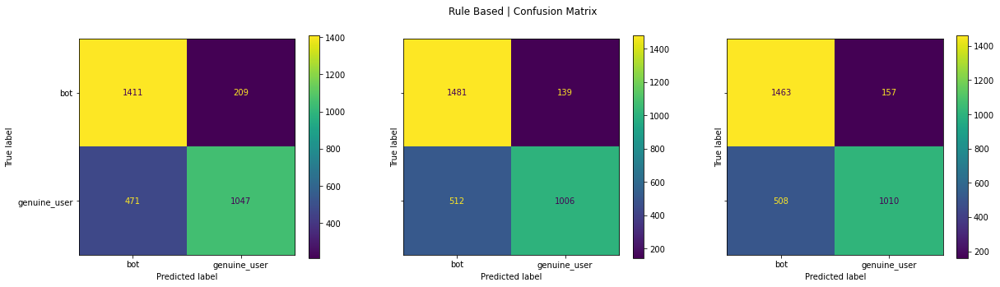

In [576]:
plot_matrix("Rule Based", test_label, test_pred_ripper, test_pred_ripper_w, test_pred_ripper_o, 1)

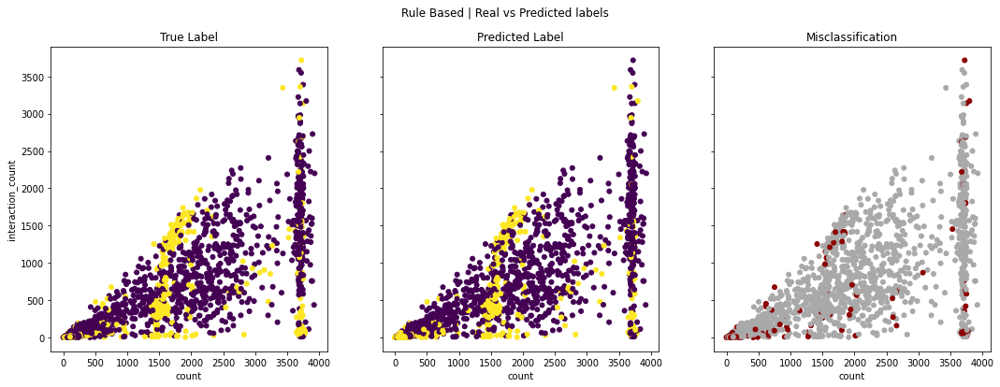

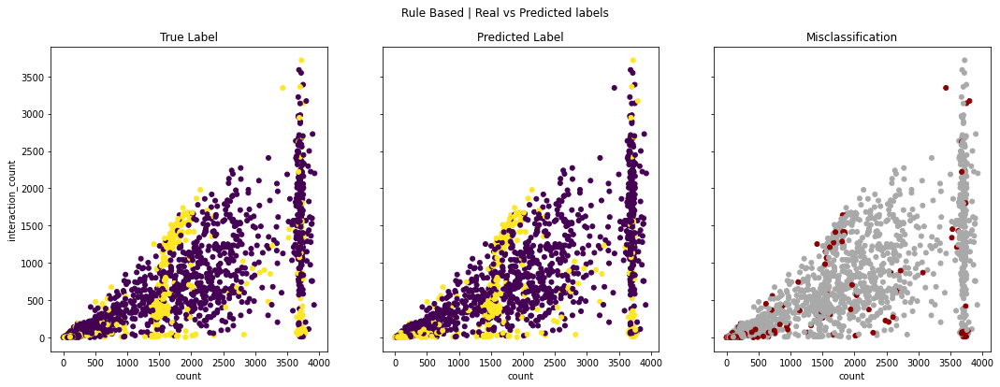

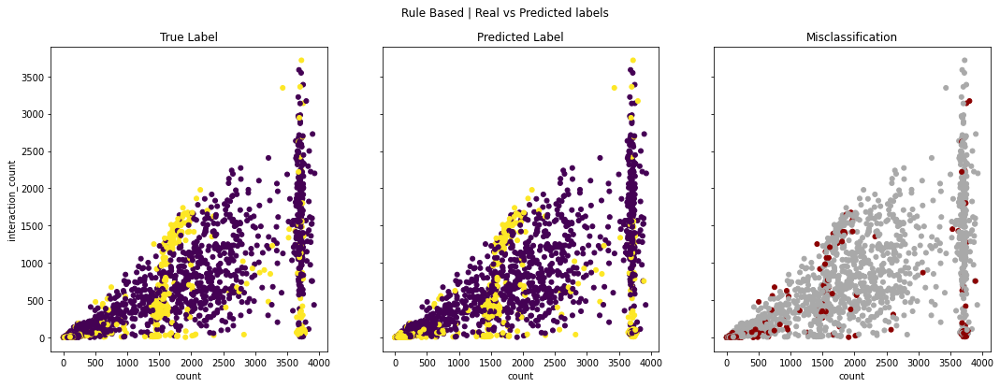

In [589]:
plot_prediction_data(test_set, test_label, test_pred_ripper, 'Rule Based', 'count', 'interaction_count')
plot_prediction_data(test_set, test_label, test_pred_ripper_w, 'Rule Based', 'count', 'interaction_count')
plot_prediction_data(test_set, test_label, test_pred_ripper_o, 'Rule Based', 'count', 'interaction_count')

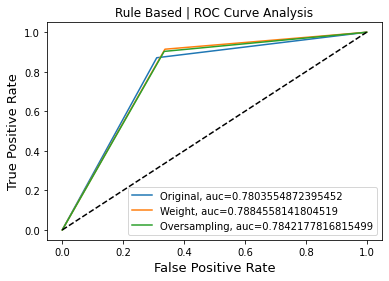

In [535]:
plot_roc("Rule Based", test_label, test_pred_ripper, test_pred_ripper_w, test_pred_ripper_o, 1)

### Neural Network Classification

In [467]:
import tensorflow as tf
model = tf.keras.models.Sequential([
        tf.keras.layers.Flatten(input_shape=(1, len(train_set.columns))),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.15),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [468]:
x_train = np.reshape(norm_train_set.values, (len(norm_train_set), 1, len(norm_train_set.columns)))
history = model.fit(x_train, train_label,
                    epochs=80,
                    batch_size=8,
                    validation_split=0.2)

Epoch 1/80
732/732 [==============================] - 18s 13ms/step - loss: 0.4744 - accuracy: 0.7778 - val_loss: 0.4222 - val_accuracy: 0.8067
Epoch 2/80
732/732 [==============================] - 8s 11ms/step - loss: 0.4014 - accuracy: 0.8118 - val_loss: 0.4056 - val_accuracy: 0.8094
Epoch 3/80
732/732 [==============================] - 5s 7ms/step - loss: 0.3909 - accuracy: 0.8152 - val_loss: 0.4057 - val_accuracy: 0.8094
Epoch 4/80
732/732 [==============================] - 6s 8ms/step - loss: 0.3871 - accuracy: 0.8163 - val_loss: 0.3945 - val_accuracy: 0.8122
Epoch 5/80
732/732 [==============================] - 6s 8ms/step - loss: 0.3808 - accuracy: 0.8210 - val_loss: 0.3989 - val_accuracy: 0.8101
Epoch 6/80
732/732 [==============================] - 6s 8ms/step - loss: 0.3784 - accuracy: 0.8214 - val_loss: 0.3898 - val_accuracy: 0.8128
Epoch 7/80
732/732 [==============================] - 5s 7ms/step - loss: 0.3755 - accuracy: 0.8200 - val_loss: 0.3900 - val_accuracy: 0.8156
Epo

In [469]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_6 (Flatten)         (None, 19)                0         
                                                                 
 dense_12 (Dense)            (None, 128)               2560      
                                                                 
 dropout_6 (Dropout)         (None, 128)               0         
                                                                 
 dense_13 (Dense)            (None, 1)                 129       
                                                                 
Total params: 2,689
Trainable params: 2,689
Non-trainable params: 0
_________________________________________________________________


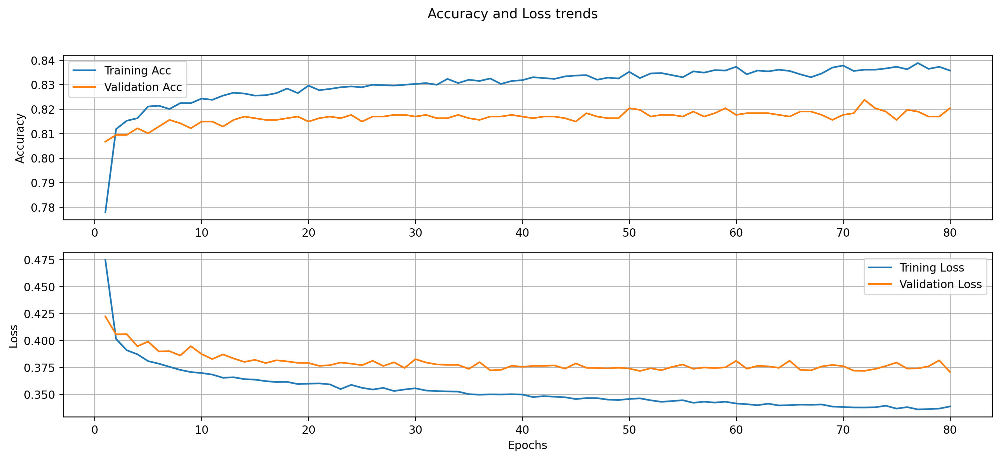

In [470]:
from matplotlib.pyplot import figure
fig, (acc_plot, loss_plot) = plt.subplots(2, figsize=(15, 6), dpi=240)
fig.suptitle('Accuracy and Loss trends')
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
acc_plot.plot(epochs, acc, label='Training Acc')
acc_plot.plot(epochs, val_acc, label='Validation Acc')
acc_plot.legend(loc='best')
acc_plot.set_ylabel('Accuracy')
#acc_plot.set_ylim([0,1])
acc_plot.grid(True)
loss_plot.plot(epochs, loss, label='Trining Loss')
loss_plot.plot(epochs, val_loss, label='Validation Loss')
loss_plot.legend(loc='best')
loss_plot.set_ylabel('Loss')
#loss_plot.set_ylim([0,1])
loss_plot.set_xlabel('Epochs')
loss_plot.grid(True)

In [478]:
x_train_test = np.reshape(norm_train_set.values, (len(norm_train_set), 1, len(train_set.columns)))
train_pred_nn = (model.predict(x_train_test) > 0.5).astype("int32")

229/229 [==============================] - 2s 10ms/step


In [482]:
x_test = np.reshape(norm_test_set.values, (len(norm_test_set), 1, len(norm_test_set.columns)))
test_pred_nn = (model.predict(x_test) > 0.5).astype("int32")

99/99 [==============================] - 1s 7ms/step


##### Weighted Classification

In [395]:
weights_nn = {0: 0.75, 1: 3.5}
class_weights = class_weight.compute_class_weight(class_weight = weights_nn,
                                                 classes = np.unique(train_label),
                                                 y = train_label)
class_weights = dict(enumerate(class_weights))
print(class_weights)

{0: 0.75, 1: 3.5}


In [396]:
model = tf.keras.models.Sequential([
        tf.keras.layers.Flatten(input_shape=(1, len(train_set.columns))),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.15),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [397]:
x_train = np.reshape(norm_train_set.values, (len(norm_train_set), 1, len(norm_train_set.columns)))
history = model.fit(x_train, train_label,
                    epochs=80,
                    batch_size=8,
                    validation_split=0.2,
                    class_weight=class_weights,)

Epoch 1/80
732/732 [==============================] - 2s 2ms/step - loss: 0.6737 - accuracy: 0.7416 - val_loss: 0.5386 - val_accuracy: 0.7964
Epoch 2/80
732/732 [==============================] - 2s 2ms/step - loss: 0.5415 - accuracy: 0.8043 - val_loss: 0.5335 - val_accuracy: 0.7985
Epoch 3/80
732/732 [==============================] - 2s 2ms/step - loss: 0.5277 - accuracy: 0.8069 - val_loss: 0.5712 - val_accuracy: 0.7978
Epoch 4/80
732/732 [==============================] - 2s 3ms/step - loss: 0.5195 - accuracy: 0.8081 - val_loss: 0.5183 - val_accuracy: 0.7978
Epoch 5/80
732/732 [==============================] - 3s 4ms/step - loss: 0.5148 - accuracy: 0.8082 - val_loss: 0.5574 - val_accuracy: 0.7964
Epoch 6/80
732/732 [==============================] - 3s 4ms/step - loss: 0.5083 - accuracy: 0.8099 - val_loss: 0.5420 - val_accuracy: 0.7978
Epoch 7/80
732/732 [==============================] - 3s 4ms/step - loss: 0.5029 - accuracy: 0.8128 - val_loss: 0.5825 - val_accuracy: 0.7889
Epoch 

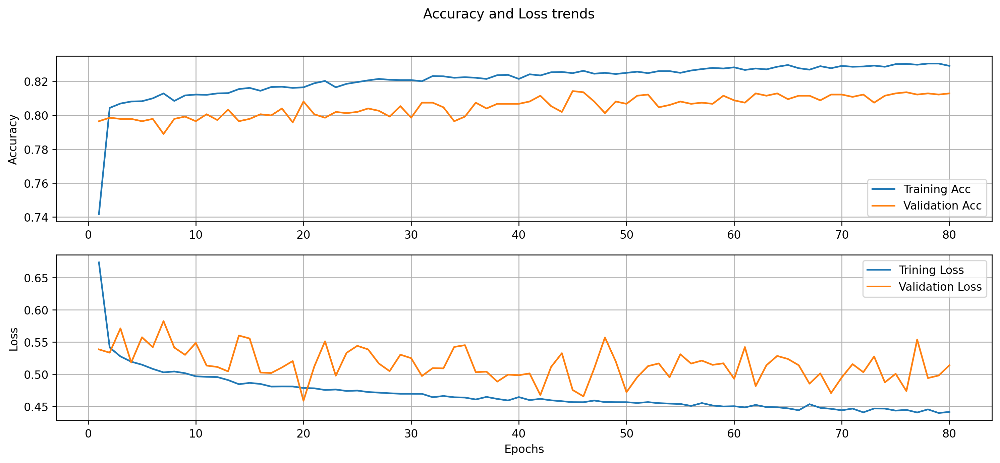

In [398]:
from matplotlib.pyplot import figure
fig, (acc_plot, loss_plot) = plt.subplots(2, figsize=(15, 6), dpi=240)
fig.suptitle('Accuracy and Loss trends')
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
acc_plot.plot(epochs, acc, label='Training Acc')
acc_plot.plot(epochs, val_acc, label='Validation Acc')
acc_plot.legend(loc='best')
acc_plot.set_ylabel('Accuracy')
#acc_plot.set_ylim([0,1])
acc_plot.grid(True)
loss_plot.plot(epochs, loss, label='Trining Loss')
loss_plot.plot(epochs, val_loss, label='Validation Loss')
loss_plot.legend(loc='best')
loss_plot.set_ylabel('Loss')
#loss_plot.set_ylim([0,1])
loss_plot.set_xlabel('Epochs')
loss_plot.grid(True)

In [399]:
x_train_test = np.reshape(norm_train_set.values, (len(norm_train_set), 1, len(train_set.columns)))
train_pred_nn_w = (model.predict(x_train_test) > 0.5).astype("int32")

229/229 [==============================] - 1s 3ms/step


In [400]:
x_test = np.reshape(norm_test_set.values, (len(norm_test_set), 1, len(norm_test_set.columns)))
test_pred_nn_w = (model.predict(x_test) > 0.5).astype("int32")

99/99 [==============================] - 0s 4ms/step


##### Classification with SMOTE oversampling

In [401]:
model = tf.keras.models.Sequential([
        tf.keras.layers.Flatten(input_shape=(1, len(train_set.columns))),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.15),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [402]:
x_train = np.reshape(norm_training.values, (len(norm_training), 1, len(norm_training.columns)))
history = model.fit(x_train, labels,
                    epochs=80,
                    batch_size=8,
                    validation_split=0.2)

Epoch 1/80
756/756 [==============================] - 9s 4ms/step - loss: 0.4700 - accuracy: 0.7786 - val_loss: 0.4344 - val_accuracy: 0.7731
Epoch 2/80
756/756 [==============================] - 3s 4ms/step - loss: 0.4011 - accuracy: 0.8114 - val_loss: 0.4177 - val_accuracy: 0.7718
Epoch 3/80
756/756 [==============================] - 3s 3ms/step - loss: 0.3940 - accuracy: 0.8140 - val_loss: 0.4077 - val_accuracy: 0.7731
Epoch 4/80
756/756 [==============================] - 2s 3ms/step - loss: 0.3870 - accuracy: 0.8173 - val_loss: 0.4096 - val_accuracy: 0.7778
Epoch 5/80
756/756 [==============================] - 3s 3ms/step - loss: 0.3815 - accuracy: 0.8182 - val_loss: 0.4097 - val_accuracy: 0.7791
Epoch 6/80
756/756 [==============================] - 3s 4ms/step - loss: 0.3778 - accuracy: 0.8218 - val_loss: 0.4232 - val_accuracy: 0.7745
Epoch 7/80
756/756 [==============================] - 3s 4ms/step - loss: 0.3762 - accuracy: 0.8210 - val_loss: 0.4089 - val_accuracy: 0.7804
Epoch 

In [403]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_5 (Flatten)         (None, 19)                0         
                                                                 
 dense_10 (Dense)            (None, 128)               2560      
                                                                 
 dropout_5 (Dropout)         (None, 128)               0         
                                                                 
 dense_11 (Dense)            (None, 1)                 129       
                                                                 
Total params: 2,689
Trainable params: 2,689
Non-trainable params: 0
_________________________________________________________________


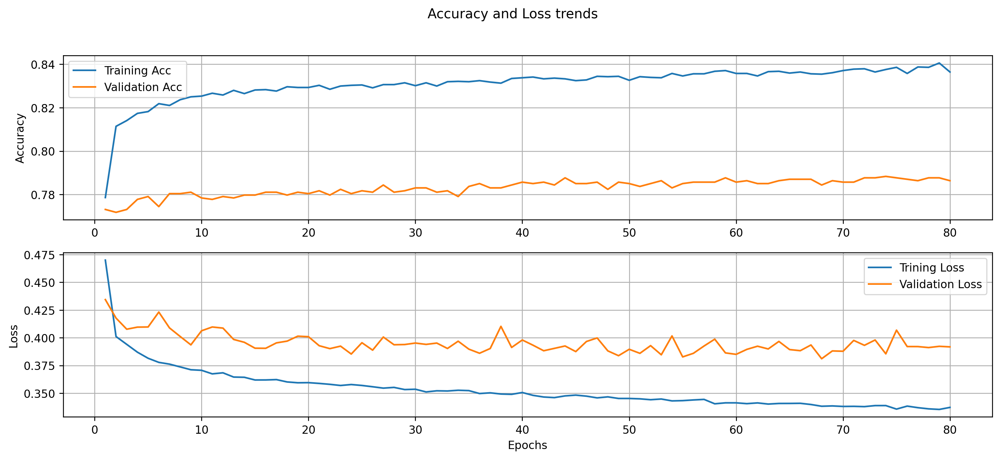

In [404]:
from matplotlib.pyplot import figure
fig, (acc_plot, loss_plot) = plt.subplots(2, figsize=(15, 6), dpi=240)
fig.suptitle('Accuracy and Loss trends')
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
acc_plot.plot(epochs, acc, label='Training Acc')
acc_plot.plot(epochs, val_acc, label='Validation Acc')
acc_plot.legend(loc='best')
acc_plot.set_ylabel('Accuracy')
#acc_plot.set_ylim([0,1])
acc_plot.grid(True)
loss_plot.plot(epochs, loss, label='Trining Loss')
loss_plot.plot(epochs, val_loss, label='Validation Loss')
loss_plot.legend(loc='best')
loss_plot.set_ylabel('Loss')
#loss_plot.set_ylim([0,1])
loss_plot.set_xlabel('Epochs')
loss_plot.grid(True)

In [405]:
x_train_test = np.reshape(norm_train_set.values, (len(norm_train_set), 1, len(train_set.columns)))
train_pred_nn_o = (model.predict(x_train_test) > 0.5).astype("int32")

229/229 [==============================] - 1s 2ms/step


In [406]:
x_test = np.reshape(norm_test_set.values, (len(norm_test_set), 1, len(norm_test_set.columns)))
test_pred_nn_o = (model.predict(x_test) > 0.5).astype("int32")

99/99 [==============================] - 0s 2ms/step


##### Evaluation

In [577]:
print("\t\t\tTRAIN RESULT")
report_score("Neural Networks", train_label, train_pred_nn)
report_score("Neural Networks Weight", train_label, train_pred_nn_w)
report_score("Neural Networks Oversampling", train_label, train_pred_nn_o)

			TRAIN RESULT
		Neural Networks
              precision    recall  f1-score   support

genuine_user       0.97      0.68      0.80      3542
         bot       0.76      0.98      0.86      3778

    accuracy                           0.84      7320
   macro avg       0.87      0.83      0.83      7320
weighted avg       0.87      0.84      0.83      7320

		Neural Networks Weight
              precision    recall  f1-score   support

genuine_user       1.00      0.65      0.79      3542
         bot       0.75      1.00      0.86      3778

    accuracy                           0.83      7320
   macro avg       0.87      0.82      0.82      7320
weighted avg       0.87      0.83      0.82      7320

		Neural Networks Oversampling
              precision    recall  f1-score   support

genuine_user       0.97      0.68      0.80      3542
         bot       0.77      0.98      0.86      3778

    accuracy                           0.84      7320
   macro avg       0.87      0.83     

In [578]:
print("\t\t\tTEST RESULT")
report_score("Neural Networks", test_label, test_pred_nn)
report_score("Neural Networks Weight", test_label, test_pred_nn_w)
report_score("Neural Networks Oversampling", test_label, test_pred_nn_o)

			TEST RESULT
		Neural Networks
              precision    recall  f1-score   support

genuine_user       0.94      0.69      0.79      1518
         bot       0.77      0.96      0.85      1620

    accuracy                           0.83      3138
   macro avg       0.85      0.82      0.82      3138
weighted avg       0.85      0.83      0.82      3138

		Neural Networks Weight
              precision    recall  f1-score   support

genuine_user       0.96      0.67      0.79      1518
         bot       0.76      0.98      0.85      1620

    accuracy                           0.83      3138
   macro avg       0.86      0.82      0.82      3138
weighted avg       0.86      0.83      0.82      3138

		Neural Networks Oversampling
              precision    recall  f1-score   support

genuine_user       0.93      0.69      0.79      1518
         bot       0.77      0.95      0.85      1620

    accuracy                           0.82      3138
   macro avg       0.85      0.82      

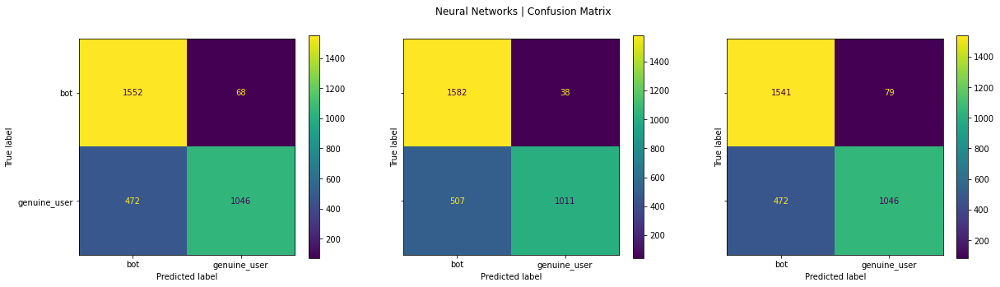

In [579]:
plot_matrix("Neural Networks", test_label, test_pred_nn, test_pred_nn_w, test_pred_nn_o, 1)

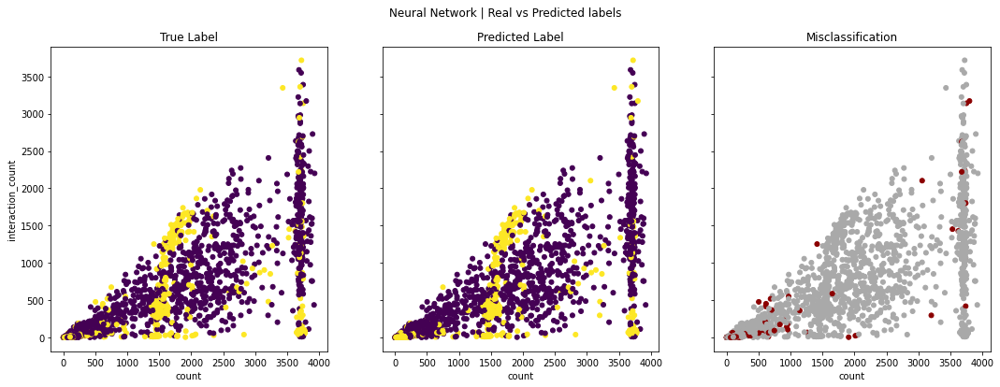

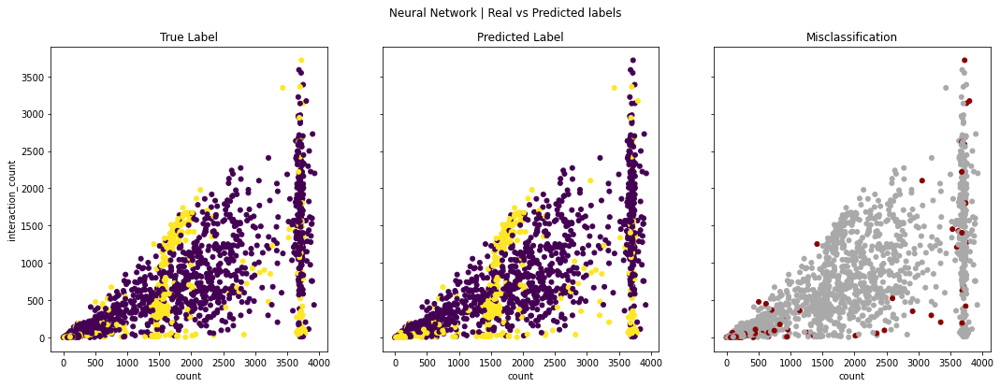

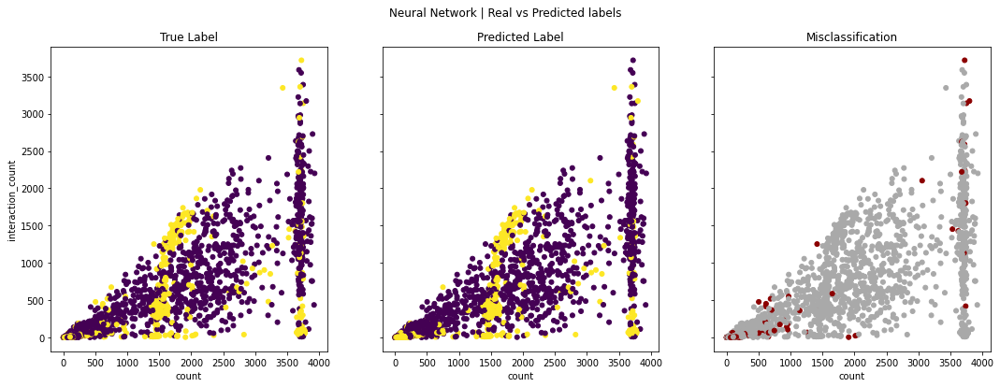

In [583]:
plot_prediction_data(test_set, test_label, test_pred_nn, 'Neural Network', 'count', 'interaction_count')
plot_prediction_data(test_set, test_label, test_pred_nn_w, 'Neural Network', 'count', 'interaction_count')
plot_prediction_data(test_set, test_label, test_pred_nn_o, 'Neural Network', 'count', 'interaction_count')

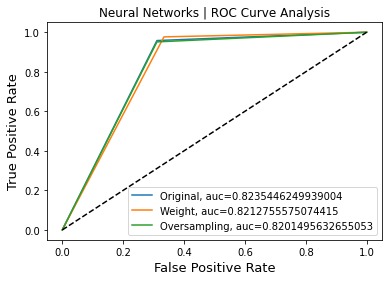

In [536]:
plot_roc("Neural Networks", test_label, test_pred_nn, test_pred_nn_w, test_pred_nn_o, 1)

### K-Nearest Neighbour Classification

In [411]:
k_range = range(1, 31)
knn_metrics = ['euclidean', 'manhattan']
knn_weights = ['uniform', 'distance']
knn_algorithms = ['ball_tree', 'kd_tree', 'brute']

knn_param_grid = {
    'n_neighbors': k_range,
    'metric': knn_metrics,
    'algorithm': knn_algorithms,
    'weights': knn_weights
}

In [412]:
knn_grid = GridSearchCV(KNeighborsClassifier(), knn_param_grid, cv=10, scoring='accuracy')
knn_grid.fit(train_set, train_label)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                         'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': range(1, 31),
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [413]:
print('Accuracy: ' + str(knn_grid.best_score_))
print('Parameters: ' + str(knn_grid.best_params_))

Accuracy: 0.8061475409836065
Parameters: {'algorithm': 'ball_tree', 'metric': 'euclidean', 'n_neighbors': 23, 'weights': 'distance'}


In [414]:
knn = KNeighborsClassifier(**knn_grid.best_params_)
model = knn.fit(train_set, train_label)

In [415]:
train_pred_knn = model.predict(train_set)
test_pred_knn = model.predict(test_set)

##### Classification with SMOTE oversampling

In [416]:
k_range = range(1, 31)
knn_metrics = ['euclidean', 'manhattan']
knn_weights = ['uniform', 'distance']
knn_algorithms = ['ball_tree', 'kd_tree', 'brute']

knn_param_grid = {
    'n_neighbors': k_range,
    'metric': knn_metrics,
    'algorithm': knn_algorithms,
    'weights': knn_weights
}

In [417]:
knn_grid = GridSearchCV(KNeighborsClassifier(), knn_param_grid, cv=10, scoring='accuracy')
knn_grid.fit(training, labels)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                         'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': range(1, 31),
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [418]:
knn = KNeighborsClassifier(**knn_grid.best_params_)
model = knn.fit(train_set, train_label)

In [419]:
train_pred_knn_o = model.predict(train_set)
test_pred_knn_o = model.predict(test_set)

##### Evaluation

In [580]:
print("\t\t\tTRAIN RESULT")
report_score("K-NN", train_label, train_pred_knn)
report_score("K-NN Oversampling", train_label, train_pred_knn_o)

			TRAIN RESULT
		K-NN
              precision    recall  f1-score   support

genuine_user       1.00      1.00      1.00      3542
         bot       1.00      1.00      1.00      3778

    accuracy                           1.00      7320
   macro avg       1.00      1.00      1.00      7320
weighted avg       1.00      1.00      1.00      7320

		K-NN Oversampling
              precision    recall  f1-score   support

genuine_user       1.00      1.00      1.00      3542
         bot       1.00      1.00      1.00      3778

    accuracy                           1.00      7320
   macro avg       1.00      1.00      1.00      7320
weighted avg       1.00      1.00      1.00      7320



In [581]:
print("\t\t\tTEST RESULT")
report_score("K-NN", test_label, test_pred_knn)
report_score("K-NN Oversampling", test_label, test_pred_knn_o)

			TEST RESULT
		K-NN
              precision    recall  f1-score   support

genuine_user       0.91      0.66      0.77      1518
         bot       0.75      0.94      0.83      1620

    accuracy                           0.80      3138
   macro avg       0.83      0.80      0.80      3138
weighted avg       0.83      0.80      0.80      3138

		K-NN Oversampling
              precision    recall  f1-score   support

genuine_user       0.91      0.66      0.76      1518
         bot       0.74      0.94      0.83      1620

    accuracy                           0.80      3138
   macro avg       0.83      0.80      0.80      3138
weighted avg       0.83      0.80      0.80      3138



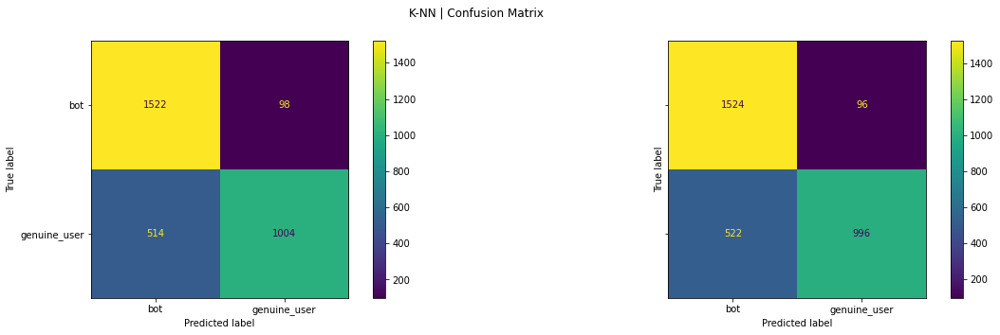

In [582]:
plot_matrix("K-NN", test_label, test_pred_knn, None, test_pred_knn_o, 0)

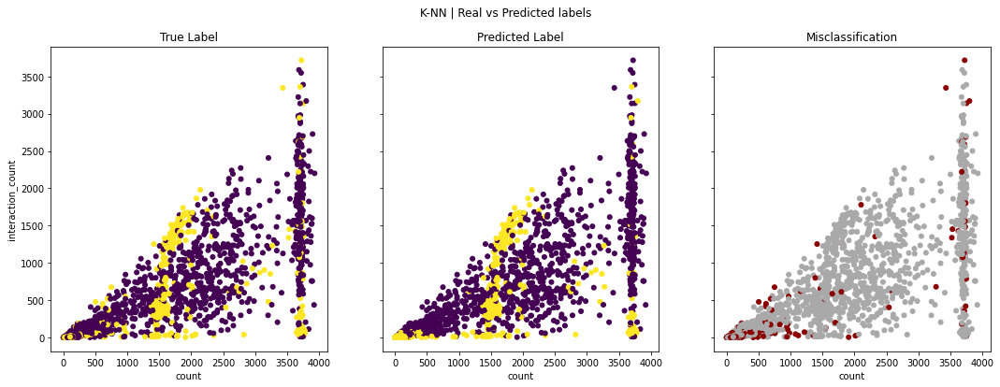

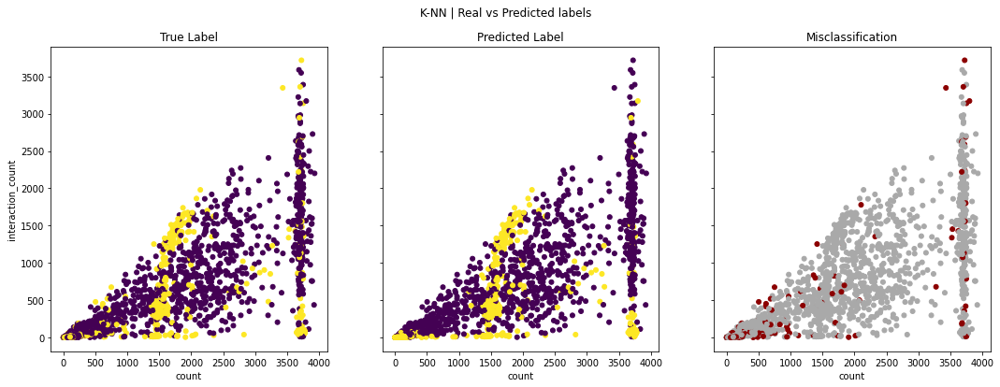

In [590]:
plot_prediction_data(test_set, test_label, test_pred_knn, 'K-NN', 'count', 'interaction_count')
plot_prediction_data(test_set, test_label, test_pred_knn_o, 'K-NN', 'count', 'interaction_count')

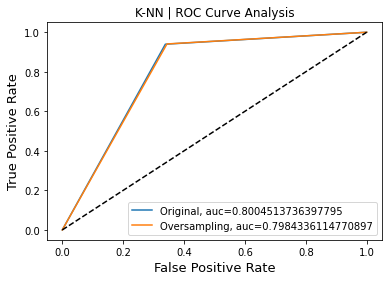

In [537]:
plot_roc("K-NN", test_label, test_pred_knn, None, test_pred_knn_o, 0)